**Title**: Find Person in the Dark

**Description**: Pedestrian detection in low light conditions.

**Link to Kaggle**: https://www.kaggle.com/competitions/find-person-in-the-dark/overview

**Dataset**: The dataset used in this competition contains **15030 visible light images**(11782 images for training and 3248 for testing), it is a subset of our previous work: LLVIP: A Visible-infrared Paired Dataset for Low-light Vision. In low light conditions, even the human eye can hardly distinguish pedestrians. Therefore, our pedestrian marking work is completed with the assistance of infrared light images.

plan

1. Problem Setup and EDA
    - visualize examples, touch the data
    - check distribution of bboxes
2. Train Base model to start
    - try pretrained detectors: YOLOv8n,YOLOv8s
    - transfer learning with COCO

3. Augmentation
 - ColorJitter, RandomBrightnessContrast, GaussianBlur, RandomGamma
 - use of Albumentations

4. Training:
 - fine-tune last layers
 - save best weights for mAP@0.5/mAP@0.75

### Problem Setup and EDA

In [1]:
import random, numpy as np, torch
random.seed(42); np.random.seed(42); torch.manual_seed(42)

In [1]:
import zipfile

zip_file_path = 'find-person-in-the-dark.zip'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall()

In [5]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
from ultralytics import YOLO
import seaborn as sns
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches 
from custom_dataset import CustomDataset
from custom_trainer import CustomTrainer
import shutil
import glob
from PIL import Image
import imagehash
from sklearn.model_selection import GroupShuffleSplit
from collections import Counter

In [7]:
train_img_dir = r"X:\Desktop\sergek\train\train\train_images"
train_lbl_dir = r"X:\Desktop\sergek\train\yolo_labels"

img_shapes = []
label_counts = Counter()
bad_labels = []
empty_labels = 0

for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith(".txt"):
        continue
    
    img_file = os.path.splitext(lbl_file)[0] + ".jpg"
    img_path = os.path.join(train_img_dir, img_file)
    lbl_path = os.path.join(train_lbl_dir, lbl_file)

    if not os.path.exists(img_path):
        print(f"Missing image for {lbl_file}")
        continue

    img = cv2.imread(img_path)
    if img is None:
        print(f"Corrupt image: {img_file}")
        continue
    
    h, w = img.shape[:2]
    img_shapes.append((w, h))

    with open(lbl_path, "r") as f:
        lines = [l.strip() for l in f.readlines() if l.strip()]
        if not lines:
            empty_labels += 1
        for line in lines:
            parts = line.split()
            if len(parts) < 5:
                bad_labels.append((lbl_file, line))
                continue
            cls = int(parts[0])
            label_counts[cls] += 1


In [8]:
print(f"Total images: {len(img_shapes)}")
print(f"Total label files: {len(os.listdir(train_lbl_dir))}")
print(f"Empty label files: {empty_labels}")
print(f"Bad label lines: {len(bad_labels)}")

Total images: 11782
Total label files: 11782
Empty label files: 1
Bad label lines: 0


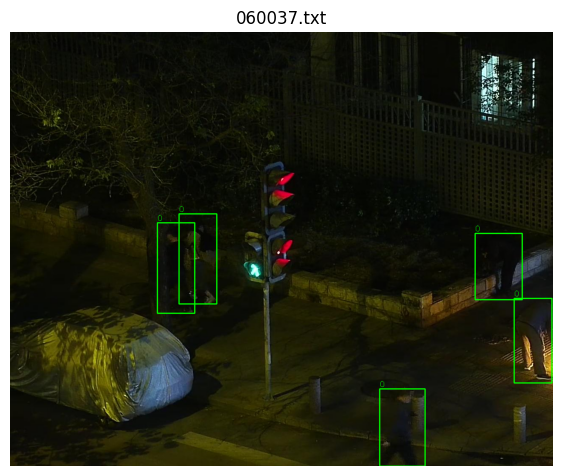

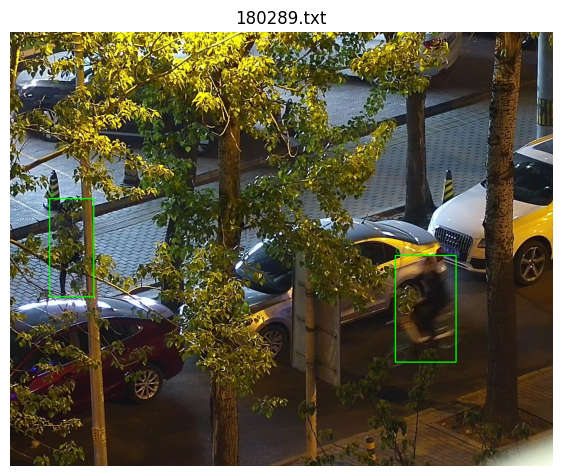

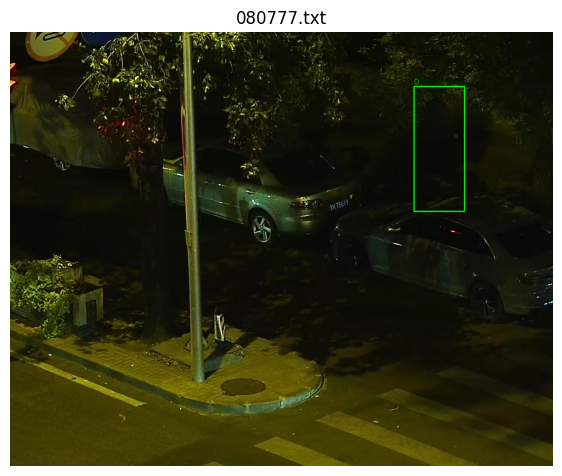

In [10]:
sample_files = np.random.choice(list(os.listdir(train_lbl_dir)), 3, replace=False)

for lbl_file in sample_files:
    img_file = os.path.splitext(lbl_file)[0] + ".jpg"
    img_path = os.path.join(train_img_dir, img_file)
    lbl_path = os.path.join(train_lbl_dir, lbl_file)

    img = cv2.imread(img_path)
    if img is None:
        continue
    h, w = img.shape[:2]
    with open(lbl_path, "r") as f:
        lines = f.readlines()
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 5:
            continue
        cls, xc, yc, bw, bh = map(float, parts[:5])
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
        cv2.putText(img, f"{int(cls)}", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 1)
    plt.figure(figsize=(7,7))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(lbl_file)
    plt.axis("off")
    plt.show()


### Preprocess

In [3]:
train_img_dir = 'train/train/train_images'
train_ann_dir = 'train/train/train_annotations'

images = [f for f in os.listdir(train_img_dir) if f.endswith(('.jpg', '.png'))]
labels = [f for f in os.listdir(train_ann_dir) if f.endswith(('.xml'))]

print(f"Total images: {len(images)}")
print(f"Total annotations: {len(labels)}")

Total images: 11782
Total annotations: 11782


In [7]:
missing_labbels = [img for img in images if img.replace('.jpg', '.xml') not in labels]
print(f"Images without annotations:{len(missing_labbels)}")

Images without annotations:0


In [18]:
# def visualize_annotations(img_path, label_path):
#     img = cv2.imread(img_path)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     fig, ax = plt.subplots(1, figsize=(8,8))
#     ax.imshow(img)

#     with open(label_path, "r") as f:
#         for line in f.readlines():
#             parts = line.strip().split()
#             if len(parts) < 6:
#                 continue
#             cls = parts[0]

#             xmin, ymin, w, h = map(float, parts[-4:])
#             rect = patches.Rectangle((xmin, ymin), w, h, linewidth=2, edgecolor='lime', facecolor='none')
#             ax.add_patch(rect)
#             ax.text(xmin,  ymin-5, cls, color='yellow', fontsize=10, weight = 'bold')
#     plt.title(os.path.basename(img_path))
#     plt.show()

different approach is needed for Pascal VOC format -> so called .xml
so my course code was supposed for .txt and not applicable to this case

In [28]:
def visualize_annotations_voc(img_path, xml_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1, figsize=(8,8))
    ax.imshow(img)

# here we start parsing xml
    tree = ET.parse(xml_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        cls = obj.find('name').text
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        width = xmax - xmin
        height = ymax - ymin

        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=2, edgecolor='lime', facecolor='none')
        ax.add_patch(rect)
        ax.text(xmin,  ymin-5, cls, color='yellow', fontsize=10, weight = 'bold')
    plt.title(os.path.basename(img_path))
    plt.show()

In [21]:
# visualize_annotations(os.path.join(train_img_dir, images[0]), os.path.join(train_ann_dir, images[0].replace('.jpg', '.xml')))

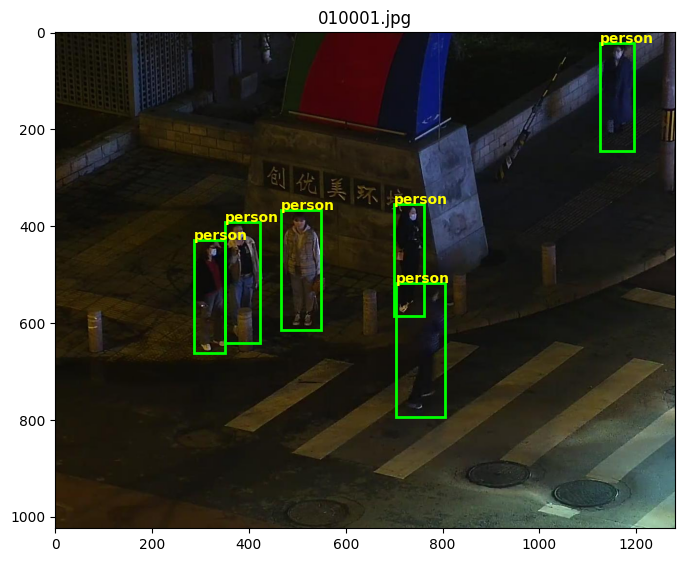

In [25]:
visualize_annotations_voc(os.path.join(train_img_dir, images[0]), os.path.join(train_ann_dir, images[0].replace('.jpg', '.xml')))

In [3]:
def display_images(images, labels, class_labels, indices):
    num_samples = len(indices)
    plt.figure(figsize=(15, 8), dpi=200)
    for i, idx in enumerate(indices):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[idx], cmap='gray')
        plt.title(f"Class: {class_labels[labels[idx][0]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [10]:
class_labels = ["person"]
y_labels = [[0] for _ in labels]

In [13]:
# plot_class_distribution(y_labels, class_labels) 

In [16]:
sample_indices = np.random.choice(len(images), size=3, replace=False)
imgs = [cv2.cvtColor(cv2.imread(os.path.join(train_img_dir, images[i])), cv2.COLOR_BGR2RGB) for i in sample_indices]

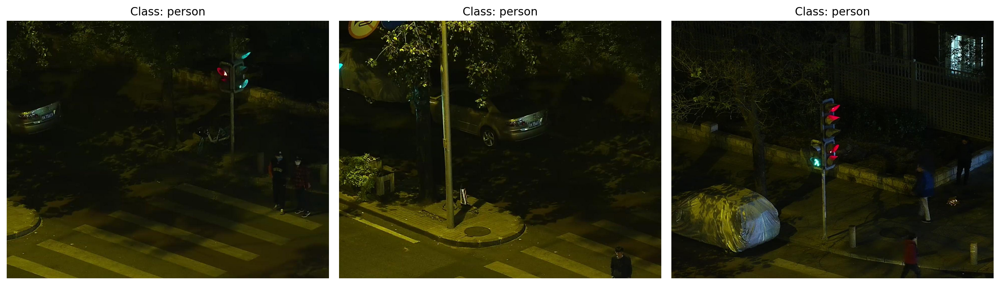

In [17]:
display_images(imgs, y_labels, class_labels, range(3))

check bbox stats

In [29]:
bbox_data = []

for lbl in labels:
    xml_path = os.path.join(train_ann_dir, lbl)
    img_path = os.path.join(train_img_dir, lbl.replace('.xml', '.jpg'))
    
    img = cv2.imread(img_path) 

    if img is None:
        continue
    h_img, w_img = img.shape[:2]

    tree = ET.parse(xml_path)
    root = tree.getroot()

    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        w = xmax - xmin
        h = ymax - ymin

        aspect = w / h if h>0 else 0
        rel_area = (w * h)/(w_img*h_img) if w_img*h_img > 0 else 0

        bbox_data.append([w,h, aspect, rel_area])

bbox_df = pd.DataFrame(bbox_data, columns=['width', 'height', 'aspect_ratio', 'relative_area'])

In [30]:
bbox_df.head()

,width,height,aspect_ratio,relative_area
0,64,234,0.273504,0.011426
1,73,251,0.290837,0.013979
2,84,247,0.340081,0.015829
3,61,231,0.264069,0.010751
4,102,277,0.368231,0.021556


Text(0, 0.5, 'Frequency')

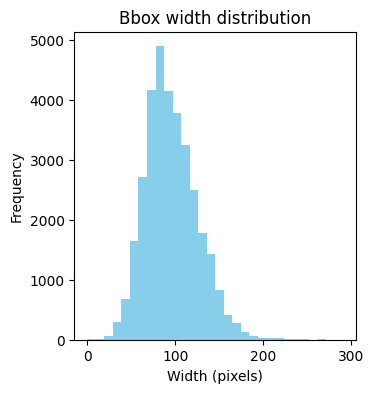

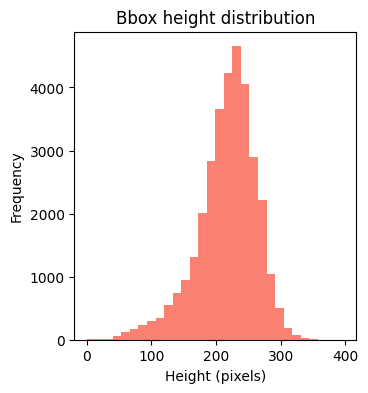

In [34]:
plt.figure(figsize=(8, 4))
plt.subplot(1,2,1)
plt.hist(bbox_df['width'], bins=30, color='skyblue')
plt.title('Bbox width distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Frequency')

plt.figure(figsize=(8, 4))
plt.subplot(1,2,2)
plt.hist(bbox_df['height'], bins=30, color='salmon')
plt.title('Bbox height distribution')
plt.xlabel('Height (pixels)')
plt.ylabel('Frequency')

- widths cluster around 70–120 px with a right-skewed tail up to 250–300 px
- very small boxes (<30–40 px) are rare but present
- few very large boxes exist

 - Single peak around ~200–260 px
 - very few very small (<100 px) 
 - extremely tall (>330 px) boxes

conclusion: pedestrians are consistently tall and slim

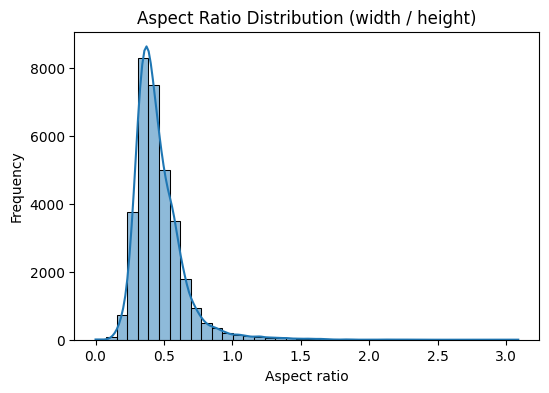

In [ ]:
plt.figure(figsize=(6,4))
sns.histplot(bbox_df["aspect_ratio"], bins=40, kde=True)
plt.title("Aspect Ratio Distribution (width / height)")
plt.xlabel("Aspect ratio")
plt.ylabel("Frequency")
plt.show()

- strong peak around 0.35–0.6 
- right-skewed tail to ~1.2+ means a small fraction of boxes are as wide as they are tall
- extreme outliers (>2 w/h) are very rare and are almost certainly noise or non-pedestrian artifacts

max - 0.38-0.40 vertically stretched human shapes
 it is important to take correct size for Anchor Boxes or make use of anchor free models like YOLOv8

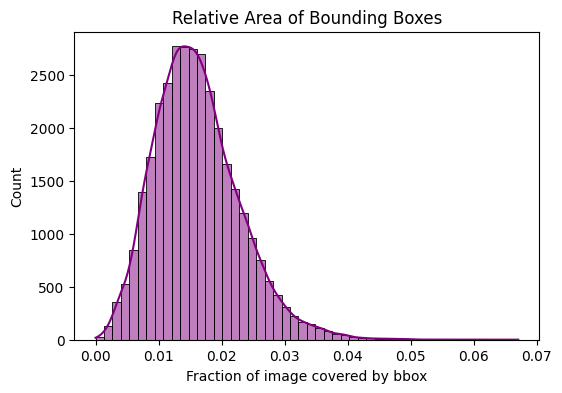

In [39]:
plt.figure(figsize=(6,4))
sns.histplot(bbox_df["relative_area"], bins=50, kde=True, color="purple")
plt.title("Relative Area of Bounding Boxes")
plt.xlabel("Fraction of image covered by bbox")
plt.ylabel("Count")
plt.show()

most pedestrians occupy 1–2% of the image

### Base Model

before we need to detect optimal anchor sizes using K-means.

to do so we cluster the width-height pair using IoU based K-Means

We have annotations in .xml;
In order to try any YOLO models we need to change it to .txt files from:
```
<object>
  <name>person</name>
  <bndbox>
    <xmin>120</xmin>
    <ymin>200</ymin>
    <xmax>200</xmax>
    <ymax>350</ymax>
  </bndbox>
</object>

```

to 
```
<class_id> <x_center> <y_center> <width> <height>
```

In [44]:
output_dir = './train/yolo_labels/'

os.makedirs(output_dir, exist_ok=True)

In [45]:
class_mapping = {"person": 0}

In [50]:
def convert_bbox_to_yolo(size, box):

    dw = 1.0 / size[0]
    dh = 1.0 / size[1]
    x_center = (box[0]+box[1]) / 2.0
    y_center = (box[2]+box[3]) / 2.0
    w = box[1] - box[0]
    h =box[3] - box[2]

    x_center, w = x_center * dw, w* dw
    y_center, h = y_center * dh, h * dh
    return (x_center, y_center, w, h) 

In [51]:
for xml_file in os.listdir(train_ann_dir):
    if not xml_file.endswith('.xml'):
        continue

    xml_path = os.path.join(train_ann_dir, xml_file)
    tree = ET.parse(xml_path)
    root = tree.getroot()

    img_name = root.find("filename").text
    img_path = os.path.join(train_img_dir, img_name)
    if not os.path.exists(img_path):

        img_name = os.path.splittext(xml_file)[0] + ".jpg"
        img_path = os.path.join(train_img_dir, img_name)
        if not os.path.exists(img_path):
            print(f"Missing image for {xml_file}, skipping...")
            continue
    
    img = cv2.imread(img_path)
    h_img, w_img = img.shape[:2]

    label_lines = []
    for obj in root.findall("object"):
        cls_name = obj.find("name").text
        if cls_name not in class_mapping:
            continue  

        cls_id = class_mapping[cls_name]
        xml_box = obj.find("bndbox")
        xmin = float(xml_box.find("xmin").text)
        ymin = float(xml_box.find("ymin").text)
        xmax = float(xml_box.find("xmax").text)
        ymax = float(xml_box.find("ymax").text)

        bb = convert_bbox_to_yolo((w_img, h_img), (xmin, xmax, ymin, ymax))
        label_lines.append(f"{cls_id} {' '.join([f'{a:.6f}' for a in bb])}")


    yolo_filename = os.path.splitext(xml_file)[0] + ".txt"
    with open(os.path.join(output_dir, yolo_filename), "w") as out_file:
        out_file.write("\n".join(label_lines))

    

In [52]:
def visualize_yolo_annotation(img_path, label_path, class_names):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Cannot read image: {img_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h_img, w_img = img.shape[:2]

    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)

    if not os.path.exists(label_path):
        print(f"Missing label file: {label_path}")
        return

    with open(label_path, "r") as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) != 5:
                continue

            cls_id, x_center, y_center, w, h = map(float, parts)
            cls_id = int(cls_id)

            
            xmin = int((x_center - w / 2) * w_img)
            ymin = int((y_center - h / 2) * h_img)
            box_w = int(w * w_img)
            box_h = int(h * h_img)

            rect = patches.Rectangle((xmin, ymin), box_w, box_h,
                                     linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)
            ax.text(xmin, ymin - 5, class_names[cls_id],
                    color='yellow', fontsize=10, weight='bold')

    plt.title(os.path.basename(img_path))
    plt.axis('off')
    plt.show()

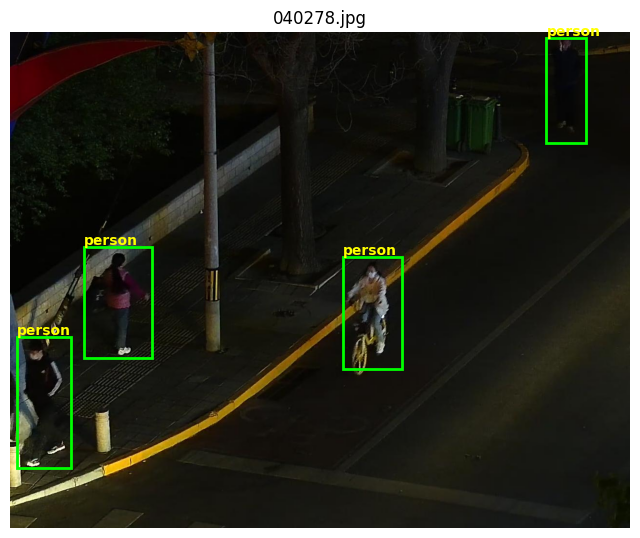

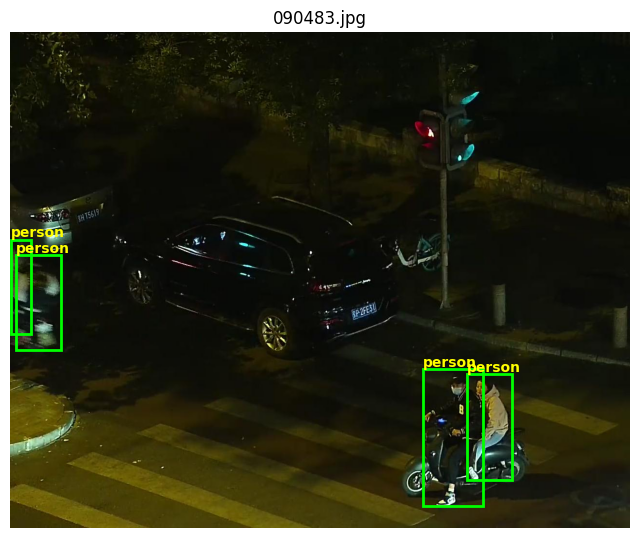

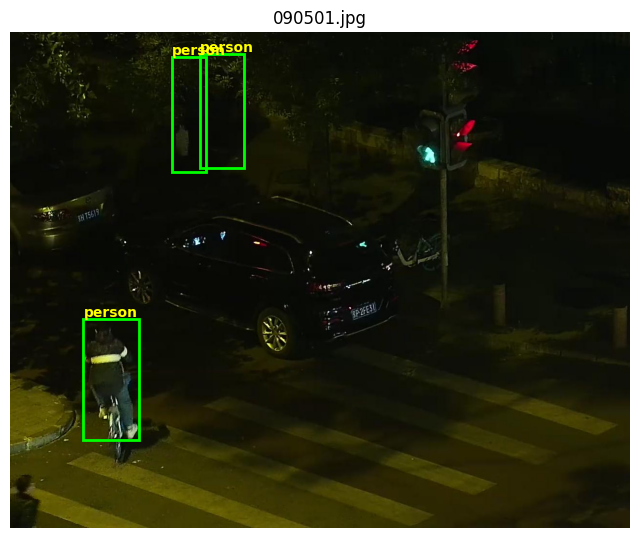

In [55]:
import random
samples = random.sample(os.listdir(train_img_dir), 3)

train_yolo_labels = 'train\yolo_labels'

for s in samples:
    img_path = os.path.join(train_img_dir, s)
    label_path = os.path.join(train_yolo_labels, os.path.splitext(s)[0] + ".txt")
    visualize_yolo_annotation(img_path, label_path, class_labels)

In [57]:
def move_files(file_set, dest_img, dest_lbl):
    for img_name in tqdm(file_set):
        lbl_name = os.path.splitext(img_name)[0] + '.txt'
        src_img = os.path.join(train_img_dir, img_name)
        src_lbl = os.path.join(train_yolo_dir, lbl_name)
        if not os.path.exists(src_lbl):
            print(f"missing label for {img_name}, skipping.")
            continue
        shutil.copy(src_img, dest_img)
        shutil.copy(src_lbl, dest_lbl)

In [58]:
import shutil
from tqdm import tqdm

train_img_dir = 'train/train/train_images'
train_yolo_dir = 'train/yolo_labels'

base_dir = os.getcwd()
train_img_out = os.path.join(base_dir, 'yolo/images/train')
val_img_out = os.path.join(base_dir, 'yolo/images/val')
train_lbl_out = os.path.join(base_dir, 'yolo/labels/train')
val_lbl_out = os.path.join(base_dir, 'yolo/labels/val')

os.makedirs(train_img_out, exist_ok=True)
os.makedirs(val_img_out, exist_ok=True)
os.makedirs(train_lbl_out, exist_ok=True)
os.makedirs(val_lbl_out, exist_ok=True)

val_ratio = 0.15
images = [f for f in os.listdir(train_img_dir) if f.lower().endswith(('.jpg', '.png'))]
random.shuffle(images)

val_count = int(len(images) * val_ratio)
val_files = set(images[:val_count])
train_files = set(images[val_count:])

print(f"Moving {len(train_files)} train and {len(val_files)} val samples...")

move_files(train_files, train_img_out, train_lbl_out)
move_files(val_files, val_img_out, val_lbl_out)

print("Split complete! Files organized for YOLOv8.")


Moving 10015 train and 1767 val samples...


100%|██████████| 1767/1767 [00:17<00:00, 98.20it/s] 

Split complete! Files organized for YOLOv8.


In [62]:
model = YOLO('yolov8n.pt')

model.train(
    data = 'data.yaml',
    epochs = 50,
    imgsz = 640,
    batch = 16,
    name = 'yolo_baseline'
)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_baseline, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001ADF13B5B70>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [63]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 17.03.0 MB/s, size: 161.3 KB)
val: Scanning X:\Desktop\sergek\yolo\labels\val.cache... 1767 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1767/1767 224.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 111/111 6.9it/s 16.2s0.1s
                   all       1767       5099      0.937       0.89      0.942      0.562
Speed: 1.0ms preprocess, 4.3ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to X:\Desktop\sergek\runs\detect\val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001ADFC8316F0>
curves: ['Prec

In [ ]:
results = model.predict(
    source='test/test/test_images',   
    conf=0.25,                           
    save_txt=True,                       
    save_conf=True,                      
    imgsz=640
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 512x640 2 persons, 63.1ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 512x640 1 person, 27.1ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 512x640 7 persons, 23.2ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 512x640 3 persons, 19.1ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 512x640 1 person, 18.5ms
image 

convert yolo predictions to competition expected format

In [67]:
yolo_preds_dir = 'runs/detect/predict/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("✅ Converted YOLO predictions to evaluation format (6 columns per line).")


✅ Converted YOLO predictions to evaluation format (6 columns per line).


Results of baseline model

```
ID,value
AP@0.5,0.8468
AP@0.75,0.4839
```

Final score: **0.33465**

Next, we'll try different models with some changes in augmentations applied.

### Model2

In [5]:
src_dir = 'train/train/train_images'
dst_dir = 'train/train/train_images_enhanced'
os.makedirs(dst_dir, exist_ok=True)

def enhance(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl,a,b))
    return cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

In [10]:
for f in tqdm(os.listdir(src_dir)):
    if f.endswith(('.jpg','.png')):
        img = cv2.imread(os.path.join(src_dir, f))
        cv2.imwrite(os.path.join(dst_dir, f), enhance(img))

100%|██████████| 11782/11782 [11:28<00:00, 17.12it/s]


In [11]:
src = "X:\Desktop\sergek\train\train\train_images_enhanced"
train_dst = "X:/Desktop/sergek/yolo/images/train"
val_dst = "X:/Desktop/sergek/yolo/images/val"

for folder in [train_dst, val_dst]:
    for f in tqdm(os.listdir(folder)):
        if f.endswith(('.jpg', '.png')):
            enhanced = os.path.join(src, f)
            if os.path.exists(enhanced):
                shutil.copy(enhanced, os.path.join(folder, f))


100%|██████████| 1767/1767 [00:00<00:00, 73522.23it/s]


In [ ]:
MODEL = 'yolov8s.pt'  
EPOCHS = 100
IMGSZ = 800             
BATCH = 16
DATA = 'data.yaml'

model = YOLO(MODEL)

results = model.train(
    data=DATA,
    epochs=EPOCHS,
    imgsz=IMGSZ,
    batch=BATCH,
    workers=8,
    cache=True,          
    device=0,
    half=True,            
    val=True,
    patience=10,         
    lr0=0.005,
    lrf=0.01,
    optimizer='SGD',
    augment=True,
    hsv_v=0.5,            
    scale=0.5,          
    mosaic=1.0,           
    pretrained=True,
    resume=False
)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=True, hsv_h=0.015, hsv_s=0.7, hsv_v=0.5, imgsz=800, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose=12

In [18]:
import shutil
shutil.copy('runs/detect/train/weights/best.pt', 'X:/Desktop/sergek/models/finetune_v1.pt')

'X:/Desktop/sergek/models/finetune_v1.pt'

In [19]:
metrics = model.val()
print(metrics)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 411.3189.3 MB/s, size: 202.9 KB)
val: Scanning X:\Desktop\sergek\yolo\labels\val.cache... 1767 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1767/1767 220.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 111/111 4.2it/s 26.5s0.2s
                   all       1767       5099      0.931      0.917      0.954      0.591
Speed: 2.3ms preprocess, 7.3ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to X:\Desktop\sergek\runs\detect\val2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001F0D6708BE0>
curves: 

In [ ]:
results = model.predict(
    source='test/test/test_images',   
    conf=0.25,                           
    save_txt=True,                       
    save_conf=True,                      
    imgsz=IMGSZ
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 640x800 2 persons, 75.4ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 640x800 1 person, 9.0ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 640x800 7 persons, 8.9ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 640x800 3 persons, 8.9ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 640x800 1 person, 8.6ms
image 6/32

In [21]:
yolo_preds_dir = 'runs/detect/predict2/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("✅ Converted YOLO predictions to evaluation format (6 columns per line).")


✅ Converted YOLO predictions to evaluation format (6 columns per line).


Results of augmented YOLO8s

```
ID,value
AP@0.5,0.8800
AP@0.75,0.5071

```

Final score: **0.30645**

In [ ]:
model.predict(
    source='test/test/test_images',
    imgsz=IMGSZ,
    conf=0.25,
    save_txt=True,
    save_conf=True,
    project='runs/detect',
    name='final_predictions'
)

In [ ]:
ap50, ap75 = 0.88, 0.51
with open('submission.csv','w') as f:
    f.write('ID,value\n')
    f.write(f'AP@0.5,{ap50:.4f}\nAP@0.75,{ap75:.4f}\n')


### Model3

raw training set + dynamically augmented

In [ ]:
raw_src = "X:/Desktop/sergek/train/train/train_images"          
train_dst = "X:/Desktop/sergek/yolo/images/train"
val_dst   = "X:/Desktop/sergek/yolo/images/val"

for folder in [train_dst, val_dst]:
    for f in tqdm(os.listdir(folder)):
        if f.endswith(('.jpg', '.png')):
            raw_file = os.path.join(raw_src, f)
            if os.path.exists(raw_file):
                shutil.copy(raw_file, os.path.join(folder, f))


100%|██████████| 1767/1767 [00:14<00:00, 119.89it/s]


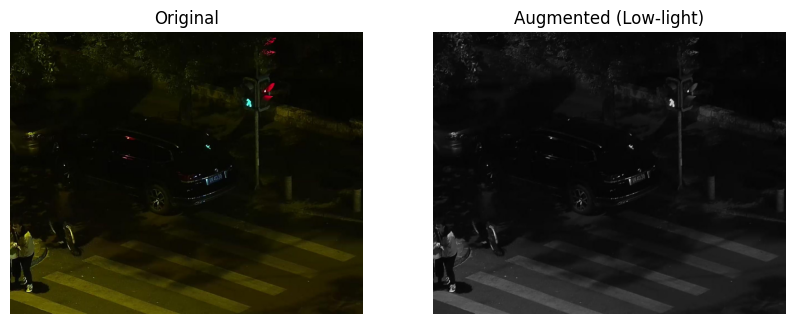

In [ ]:
transforms = get_train_transforms()
img_path = random.choice(glob.glob("X:/Desktop/sergek/yolo/images/train/*.jpg"))
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

aug = transforms(image=img)["image"]

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(aug)
plt.title("Augmented (Low-light)")
plt.axis("off")
plt.show()

In [4]:
trainer = CustomTrainer(overrides={
    "model": "yolov8s.pt",        
    "data": "data.yaml",
    "epochs": 100,
    "imgsz": 800,
    "batch": 16,
    "device": 0,
    "workers": 8,
    "augment": False,           
    "name": "yolov8s_custom_albu"
})


Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=800, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s_custom_albu33, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0,

In [5]:
trainer.args.plots = False

In [6]:
trainer.train()

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

In [16]:
# results = model.train(
#     data="data.yaml",
#     epochs=100,
#     imgsz=800,
#     batch=16,
#     device=0,
#     workers=8,
#     augment=False,
#     dataloader=train_loader,
#     pretrained=True,
#     freeze=0,
#     name="yolov8s_cstm_albu"
# )

In [ ]:
weights_path = "runs/detect/yolov8s_custom_albu33/weights/best.pt"

if not os.path.exists(weights_path):
    raise FileNotFoundError(f"Model not found at {weights_path}")

model = YOLO(weights_path)
print("✅ Model loaded successfully from local disk.")

✅ Model loaded successfully from local disk.


In [9]:
results = model.predict(
    source='test/test/test_images',   
    conf=0.25,                           
    save_txt=True,                       
    save_conf=True,                      
    imgsz=800
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 640x800 3 persons, 61.5ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 640x800 1 person, 10.3ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 640x800 5 persons, 9.1ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 640x800 2 persons, 9.8ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 640x800 3 persons, 9.3ms
image 6/

In [10]:
yolo_preds_dir = 'runs/detect/predict3/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("Converted YOLO predictions to evaluation format (6 columns per line).")


Converted YOLO predictions to evaluation format (6 columns per line).


Results of YOLO8s with custom trainer

```
ID,value
AP@0.5,0.6791
AP@0.75,0.2397

```

Final score: **0.54060**

In [11]:
for ckpt in ["best.pt", "last.pt"]:
    model = YOLO(f"runs/detect/yolov8s_custom_albu33/weights/{ckpt}")
    results = model.val(data="data.yaml", imgsz=800)
    print(f"✅ Results for {ckpt}: mAP50 = {results.box.map50:.2%}, mAP50-95 = {results.box.map:.2%}")


Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 20.010.6 MB/s, size: 171.9 KB)
val: Scanning X:\Desktop\sergek\yolo\labels\val.cache... 1767 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1767/1767 409.2Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 111/111 2.3it/s 47.6s0.2s
                   all       1767       5099      0.907      0.816      0.885       0.45
Speed: 1.7ms preprocess, 11.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to X:\Desktop\sergek\runs\detect\val3
✅ Results for best.pt: mAP50 = 88.49%, mAP50-95 = 44.96%
Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 

In [23]:
%matplotlib inline

In [ ]:
gt_dir = r"evaluate/evaluate/groundtruths"
pred_dir = r"runs/detect/predict3/labels"
img_dir = r"test/test/test_images"

def draw_boxes(img, boxes, color, label_text):
    """Draw rectangles with labels."""
    for box in boxes:
        x1, y1, w, h = map(int, box[:4])
        x2 = x1 + w
        y2 = y1 + h
        conf = box[4] if len(box) > 4 else None
        text = f"{label_text}"
        if conf is not None:
            text += f" {conf:.2f}"
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img, text, (x1, max(0, y1 - 5)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)
    return img

In [ ]:
label_files = [f for f in os.listdir(pred_dir) if f.endswith('.txt')]
sample_files = random.sample(label_files, 1)

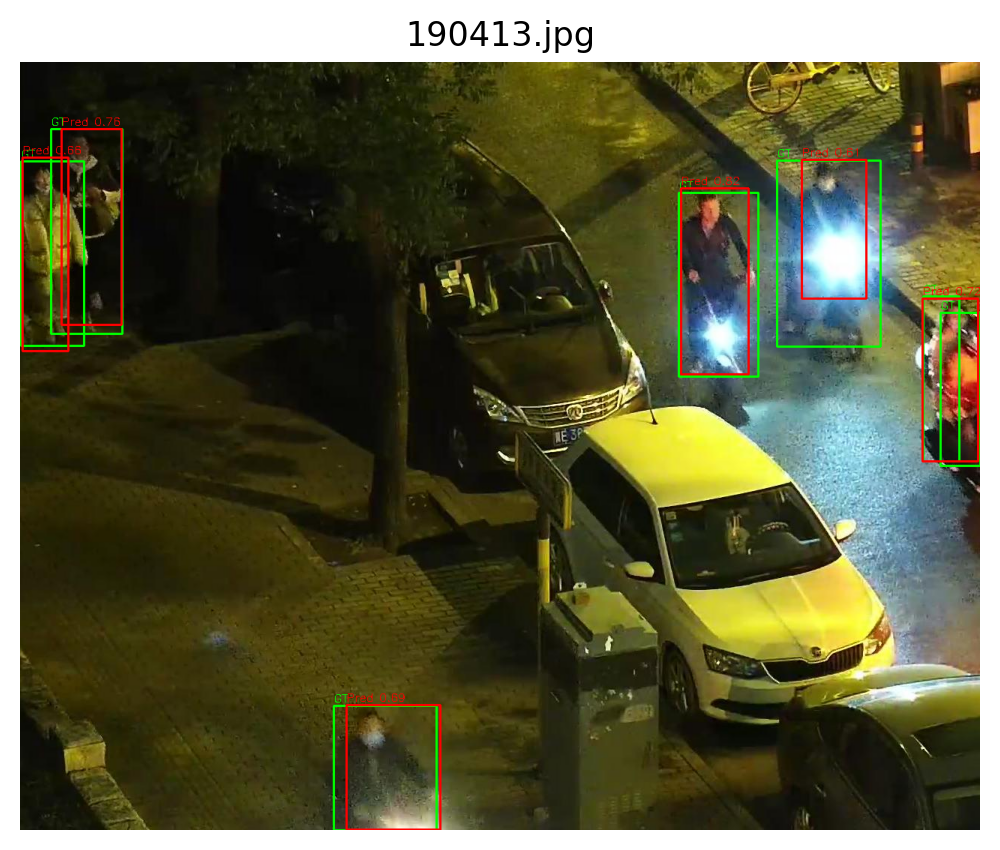

In [ ]:
plt.figure(figsize=(15, 15), dpi=200)
for idx, label_file in enumerate(sample_files, 1):
    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(img_dir, img_name)
    gt_path = os.path.join(gt_dir, label_file)
    pred_path = os.path.join(pred_dir, label_file)

    if not os.path.exists(img_path):
        print(f"⚠️ Missing image: {img_name}")
        continue

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

  
    gt_boxes = []
    if os.path.exists(gt_path):
        with open(gt_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                _, x, y, ww, hh = parts
                x, y, ww, hh = map(float, [x, y, ww, hh])
                gt_boxes.append([x, y, ww, hh])
    img_gt = draw_boxes(img.copy(), gt_boxes, (0, 255, 0), "GT")


    pred_boxes = []
    if os.path.exists(pred_path):
        with open(pred_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                if len(parts) < 6:
                    continue
                cls, xc, yc, bw, bh, conf = parts
                x1 = int((xc - bw / 2) * w)
                y1 = int((yc - bh / 2) * h)
                ww = int(bw * w)
                hh = int(bh * h)
                pred_boxes.append([x1, y1, ww, hh, conf])
    img_pred = draw_boxes(img_gt.copy(), pred_boxes, (255, 0, 0), "Pred")

    plt.subplot(1, 3, idx)
    plt.imshow(img_pred)
    plt.title(img_name)
    plt.axis("off")

plt.tight_layout()
plt.show()


### Model 4

In [ ]:
TR = r'X:/Desktop/sergek/yolo/images/train'
VL = r'X:/Desktop/sergek/yolo/images/val'

def phashes(folder, limit=3000):
    files = sorted(glob.glob(os.path.join(folder, '*')))[:limit] 
    out = {}
    for p in files:
        try:
            h = imagehash.phash(Image.open(p).convert('RGB'))
            out[p] = h
        except Exception:
            pass
    return out

h_tr = phashes(TR)
h_vl = phashes(VL)


def near_dups(h1, h2, thr=4):
    c = 0
    for p, hv in h_vl.items():
       
        for ht in list(h_tr.values())[::max(1, len(h_tr)//1000)]:
            if hv - ht <= thr:
                c += 1
                break
    return c

nd = near_dups(h_tr, h_vl, thr=4)
print("Approx cross-split near-duplicates:", nd)

Approx cross-split near-duplicates: 157


In [ ]:
IMG_DIR = r'train/train/train_images'
LBL_DIR = r'train/yolo_labels'

OUT = r'yolo_new_split'  
TR_IMG = os.path.join(OUT, 'images/train')
VL_IMG = os.path.join(OUT, 'images/val')
TR_LBL = os.path.join(OUT, 'labels/train')
VL_LBL = os.path.join(OUT, 'labels/val')
for d in [TR_IMG, VL_IMG, TR_LBL, VL_LBL]: os.makedirs(d, exist_ok=True)

imgs = sorted([p for p in glob.glob(os.path.join(IMG_DIR, '*')) if p.lower().endswith(('.jpg','.png','.jpeg'))])

hashes = []
for p in tqdm(imgs, desc='pHash'):
    try:
        h = imagehash.phash(Image.open(p).convert('RGB'))
        hashes.append((p, h))
    except Exception:
        pass

groups, group_ids = [], []
HAM_THR = 4  
for p, h in hashes:
    assigned = False
    for gi, gh in groups:
        if h - gh <= HAM_THR:
            group_ids.append(gi)
            assigned = True
            break
    if not assigned:
        gid = len(groups)
        groups.append((gid, h))
        group_ids.append(gid)

gss = GroupShuffleSplit(n_splits=1, test_size=0.15, random_state=42)
idx = list(range(len(hashes)))
train_idx, val_idx = next(gss.split(idx, groups=group_ids))
train_imgs = [hashes[i][0] for i in train_idx]
val_imgs   = [hashes[i][0] for i in val_idx]

def label_path(img_path):
    stem = os.path.splitext(os.path.basename(img_path))[0]
    return os.path.join(LBL_DIR, stem + '.txt')

def copy_pair(img_path, dest_img_dir, dest_lbl_dir):
    shutil.copy2(img_path, os.path.join(dest_img_dir, os.path.basename(img_path)))
    lp = label_path(img_path)
    out_lp = os.path.join(dest_lbl_dir, os.path.basename(lp))
    if os.path.exists(lp):
        shutil.copy2(lp, out_lp)
    else:
        open(out_lp, 'w').close() 

for p in tqdm(train_imgs, desc='copy train'): copy_pair(p, TR_IMG, TR_LBL)
for p in tqdm(val_imgs,   desc='copy val'):   copy_pair(p, VL_IMG, VL_LBL)

with open('train.txt','w') as f: [f.write(p+'\n') for p in train_imgs]
with open('val.txt','w')   as f: [f.write(p+'\n') for p in val_imgs]

print(f"Done. Train: {len(train_imgs)}   Val: {len(val_imgs)}")


copy val: 100%|██████████| 1434/1434 [00:02<00:00, 511.07it/s]

Done. Train: 10348   Val: 1434


In [58]:
TR, VL = TR_IMG, VL_IMG
tr_files = glob.glob(os.path.join(TR, '*'))
vl_files = glob.glob(os.path.join(VL, '*'))

def phash_batch(files, n=None):
    files = random.sample(files, min(n or len(files), len(files)))
    return [imagehash.phash(Image.open(p).convert('RGB')) for p in files]

tr_hash = phash_batch(tr_files, n=300)
vl_hash = phash_batch(vl_files, n=300)
thr = 4
dups = sum(any(v - t <= thr for t in tr_hash) for v in vl_hash)
print('approx cross-split near-dups in sample:', dups, '/', len(vl_hash))

approx cross-split near-dups in sample: 63 / 300


In [ ]:
m = YOLO('yolov8s.pt')

In [ ]:
m.train(
    data='data.yaml',         
    epochs=90,
    imgsz=960,                
    batch=12,                
    device=0, workers=4, cache=True, amp=True,
    optimizer='AdamW', lr0=0.001, cos_lr=True,
    mosaic=0.25, mixup=0.0, copy_paste=0.0,
    hsv_v=0.12, scale=0.2, degrees=2.0, translate=0.02,
    close_mosaic=10, patience=20,
    box=8.0, cls=0.15, dfl=1.5, name='yolo_new_split'   
)


New https://pypi.org/project/ultralytics/8.3.218 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=8.0, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.15, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=data.yaml, degrees=2.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=90, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.12, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.25, multi_scale=False, name=yolo_new_split2, nbs=64, nms=Fals

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000002C7A5003970>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [5]:
results = m.predict(
    source='test/test/test_images',   
    conf=0.25,                           
    save_txt=True,                       
    save_conf=True,                      
    imgsz=960
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 768x960 4 persons, 55.1ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 768x960 2 persons, 11.2ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 768x960 6 persons, 9.3ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 768x960 3 persons, 11.4ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 768x960 1 person, 10.3ms
image 

In [2]:
yolo_preds_dir = 'runs/detect/predict5/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("✅ Converted YOLO predictions to evaluation format (6 columns per line).")


✅ Converted YOLO predictions to evaluation format (6 columns per line).


Results of YOLO8s with new split and imgsz=960

```
ID,value
AP@0.5,0.8382
AP@0.75,0.4677


```

Final score: **0.34705**

### Model 5

In [4]:
model2_finetune = YOLO('runs/detect/train/weights/best.pt')

In [5]:
model2_finetune.train(
    data='data.yaml',
    epochs=30, imgsz=960, batch=12, device=0, workers=4, cache=True,
    optimizer='AdamW', lr0=0.001, cos_lr=True,
    pretrained=True, 
    mosaic=0.3, mixup=0.0, copy_paste=0.0,
    hsv_v=0.15, scale=0.2, degrees=2.0, shear=0.0, translate=0.02,
    patience=10
)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=12, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=data.yaml, degrees=2.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.15, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/detect/train/weights/best.pt, momentum=0.937, mosaic=0.3, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patience=10, perspecti

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001A8BC3C1D50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0480

In [6]:
results = model2_finetune.predict(
    source='test/test/test_images',   
    conf=0.25,                           
    save_txt=True,                       
    save_conf=True,                      
    imgsz=960
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 768x960 2 persons, 44.1ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 768x960 2 persons, 37.0ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 768x960 5 persons, 35.3ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 768x960 2 persons, 33.8ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 768x960 3 persons, 34.5ms
imag

In [7]:
yolo_preds_dir = 'runs/detect/predict6/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("✅ Converted YOLO predictions to evaluation format (6 columns per line).")


✅ Converted YOLO predictions to evaluation format (6 columns per line).


Results of Model 2 with new split and imgsz=960

```
ID,value
AP@0.5,0.8586
AP@0.75,0.4549
```

Final score: **0.34325**

In [9]:
import os, glob
LBL = r'yolo_new_split/labels/val'
empty = 0
for f in glob.glob(os.path.join(LBL, '*.txt')):
    if os.path.getsize(f) == 0: empty += 1
print("Empty-label (negative) files in train:", empty)

Empty-label (negative) files in train: 0


In [10]:
m = YOLO('runs/detect/train/weights/best.pt')
best = None
for conf in [0.10,0.15,0.20,0.25,0.30]:
    for iou in [0.45,0.50,0.55,0.60]:
        r = m.val(data='data.yaml', imgsz=960, conf=conf, iou=iou, batch=16, plots=False)
        score = 0.7*r.box.map50 + 0.3*r.box.map75
        best = max(best or (0,None,None), (score,conf,iou))
print('BEST', best)

Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 507.9206.8 MB/s, size: 212.8 KB)
val: Scanning X:\Desktop\sergek\yolo_new_split\labels\val.cache... 1434 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1434/1434 555.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 90/90 1.4it/s 1:040.4sss
                   all       1434       4191      0.962      0.947      0.976      0.744
Speed: 2.4ms preprocess, 30.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Ultralytics 8.3.217  Python-3.10.14 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
val: Fast image access  (ping: 0.00.0 ms, read: 1537.4818.7 MB/s, size: 169.4 KB)
val: Scanning X:\Desktop\sergek\yolo_new_split\labels\val.cache... 1434 images, 0 back

In [11]:
BEST_CONF, BEST_IOU =  0.1, 0.55
m.predict(
    source='test/test/test_images', imgsz=960, conf=BEST_CONF, iou=BEST_IOU,
    augment=True, agnostic_nms=True, save_txt=True, save_conf=True
)


WARNING 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/3248 x:\Desktop\sergek\test\test\test_images\190001.jpg: 768x960 7 persons, 200.0ms
image 2/3248 x:\Desktop\sergek\test\test\test_images\190002.jpg: 768x960 4 persons, 53.8ms
image 3/3248 x:\Desktop\sergek\test\test\test_images\190003.jpg: 768x960 9 persons, 55.3ms
image 4/3248 x:\Desktop\sergek\test\test\test_images\190004.jpg: 768x960 9 persons, 55.8ms
image 5/3248 x:\Desktop\sergek\test\test\test_images\190005.jpg: 768x960 7 persons, 54.7ms
ima

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person'}
 obb: None
 orig_img: array([[[  4,   6,   6],
         [  5,   7,   7],
         [  6,   8,   8],
         ...,
         [ 79, 129, 165],
         [ 73, 118, 155],
         [ 69, 115, 149]],
 
        [[  4,   6,   6],
         [  5,   7,   7],
         [  6,   8,   8],
         ...,
         [ 66, 116, 152],
         [ 59, 104, 141],
         [ 55, 101, 135]],
 
        [[  4,   6,   6],
         [  5,   7,   7],
         [  6,   8,   8],
         ...,
         [ 62, 112, 148],
         [ 56, 101, 138],
         [ 54, 100, 134]],
 
        ...,
 
        [[ 16,  28,  28],
         [ 15,  27,  27],
         [ 14,  26,  26],
         ...,
         [ 14,  17,  15],
         [ 14,  17,  15],
         [ 14,  17,  15]],
 
        [[ 14,  26,  26],
         [ 13,  25,  25],
         [ 12,  24,  24],
         ...,
         [ 15,  18

In [ ]:
yolo_preds_dir = 'runs/detect/predict7/labels'
test_img_dir = './test/test/test_images'
output_dir = './evaluate/evaluate/detections'

os.makedirs(output_dir, exist_ok=True)

for label_file in os.listdir(yolo_preds_dir):
    if not label_file.endswith('.txt'):
        continue

    img_name = os.path.splitext(label_file)[0] + '.jpg'
    img_path = os.path.join(test_img_dir, img_name)
    img = cv2.imread(img_path)
    if img is None:
        print(f"Missing image for {label_file}, skipping.")
        continue
    h, w = img.shape[:2]

    with open(os.path.join(yolo_preds_dir, label_file), 'r') as f:
        lines = f.readlines()

    out_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 6:
            continue
        cls_id, xc, yc, bw, bh, conf = map(float, parts)
        xmin = (xc - bw / 2) * w
        ymin = (yc - bh / 2) * h
        ww = bw * w
        hh = bh * h
        # include confidence
        out_lines.append(f"person {conf:.2f} {xmin:.0f} {ymin:.0f} {ww:.0f} {hh:.0f}")

    with open(os.path.join(output_dir, label_file), 'w') as out_f:
        out_f.write('\n'.join(out_lines))

print("✅ Converted YOLO predictions to evaluation format (6 columns per line).")

✅ Converted YOLO predictions to evaluation format (6 columns per line).


### WBF + NMS

In [ ]:
gt_dir = r"X:\Desktop\sergek\evaluate\evaluate\groundtruths"
det_dir = r"X:\Desktop\sergek\final_dets\detections"
img_dir = r"X:\Desktop\sergek\test\test\test_images"

In [ ]:
num_samples = 10
img_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
sampled = random.sample(img_files, min(num_samples, len(img_files)))

def parse_gt_line(line):
    parts = line.strip().split()
    if len(parts) < 5:
        return None
    _, x, y, w, h = parts
    return [float(x), float(y), float(w), float(h)]

def parse_det_line(line):
    parts = line.strip().split()
    if len(parts) < 6:
        return None
    _, conf, x, y, w, h = parts
    return [float(x), float(y), float(w), float(h), float(conf)]

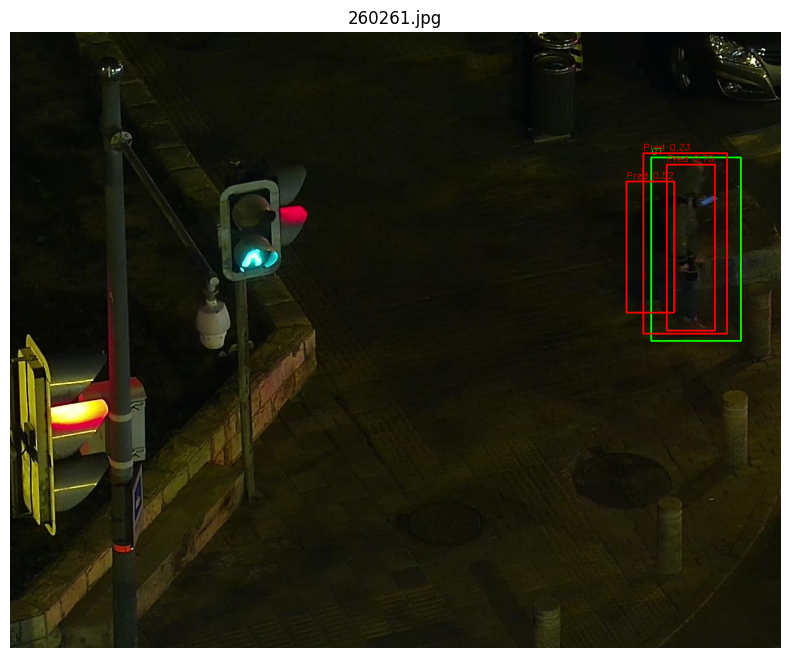

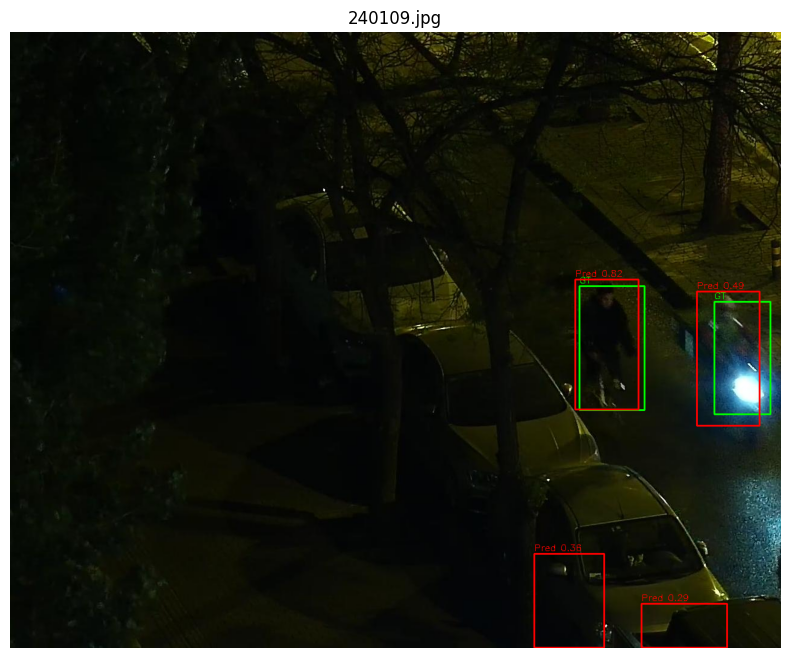

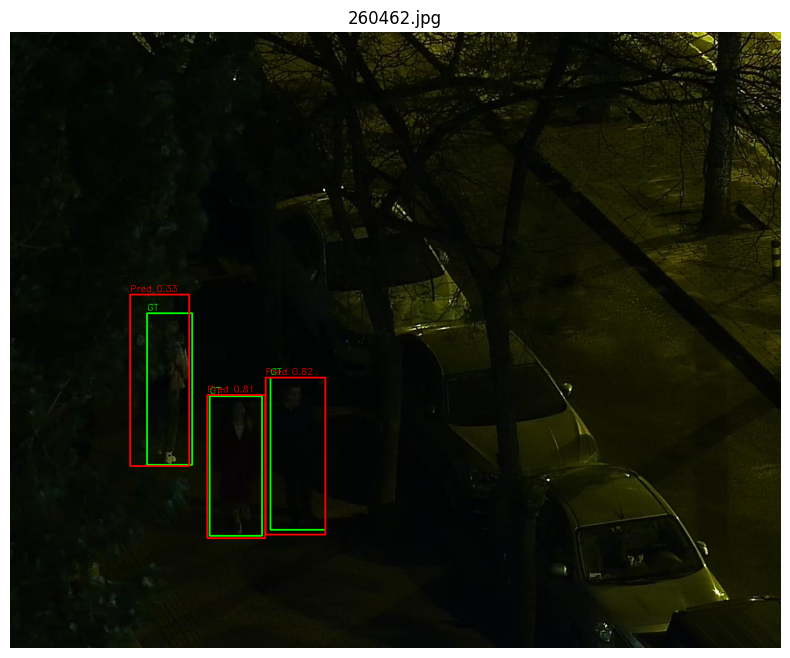

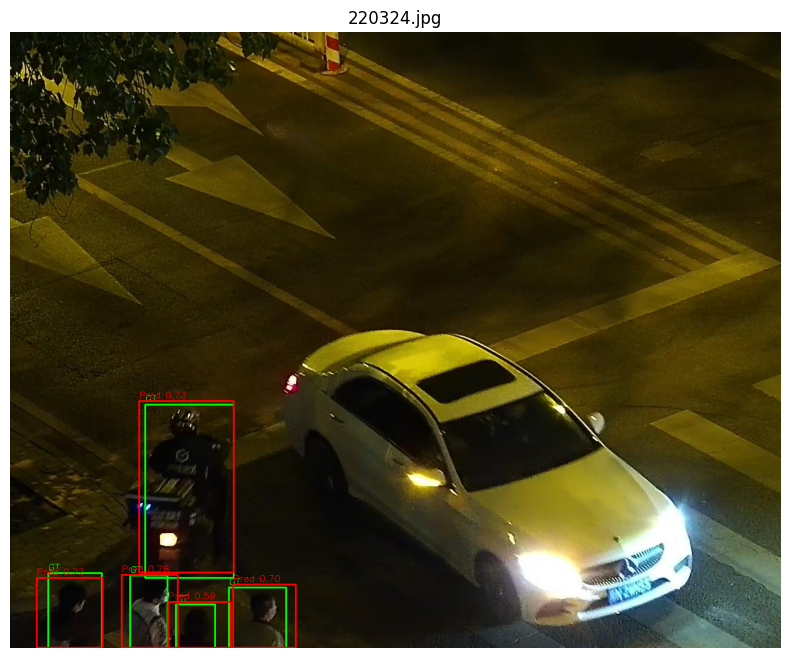

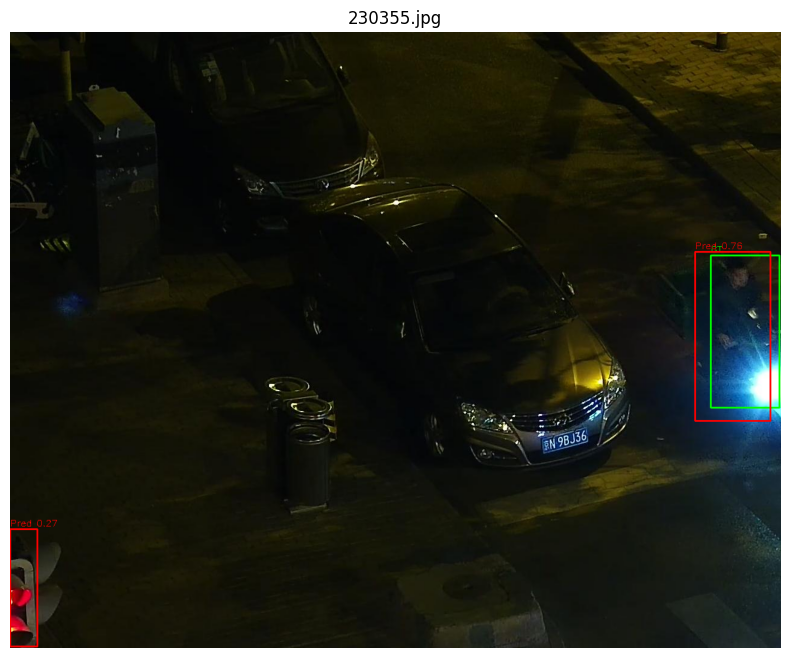

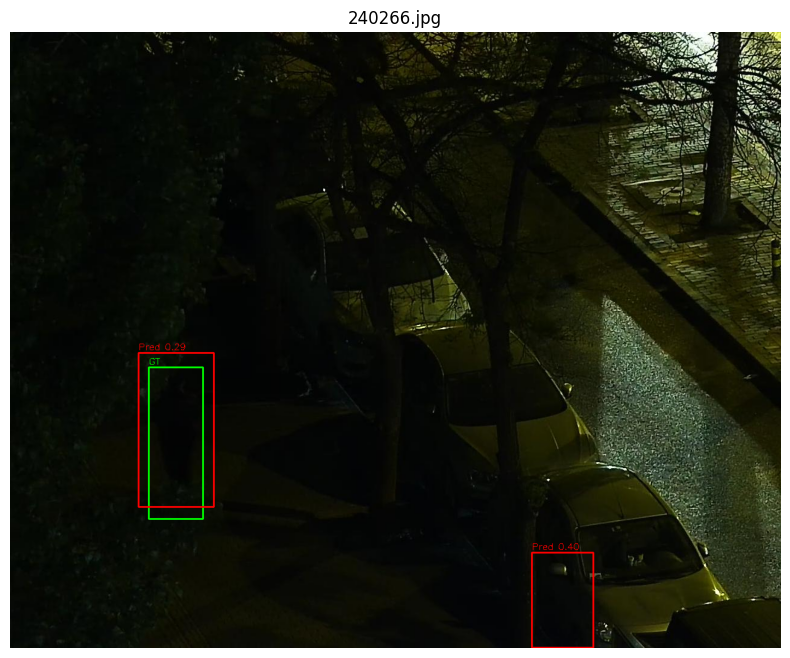

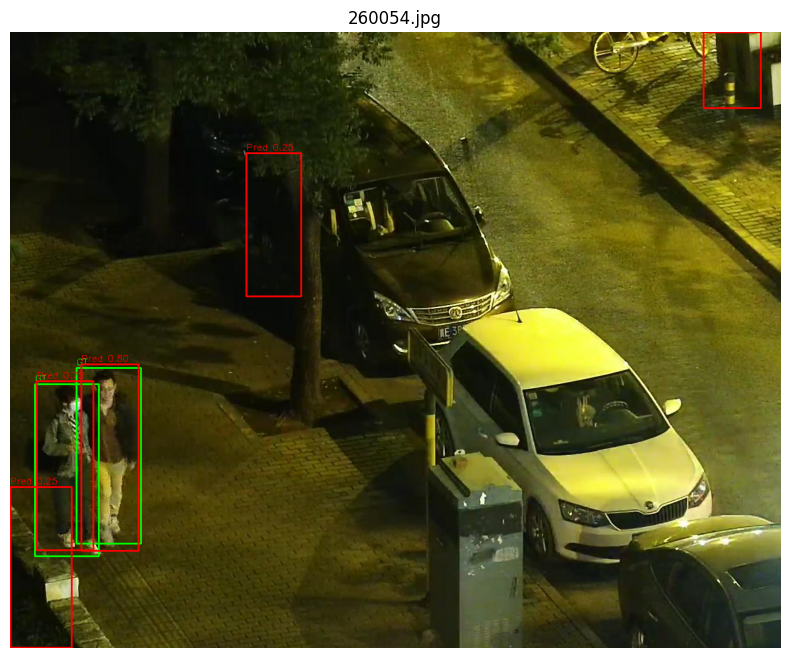

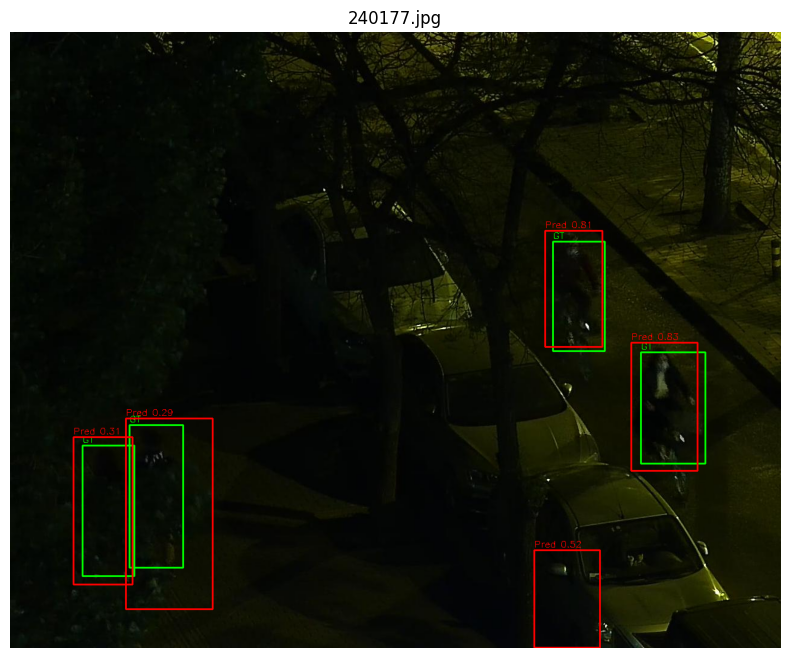

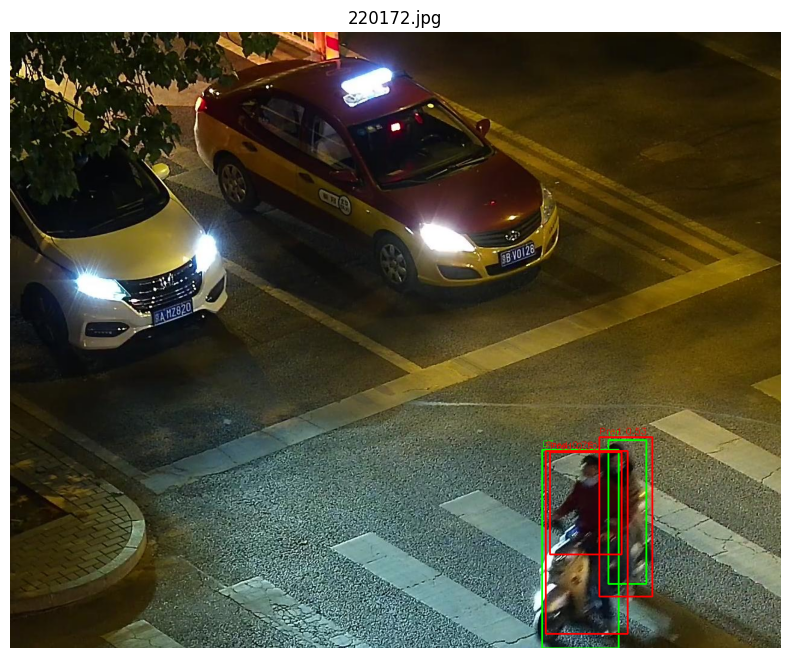

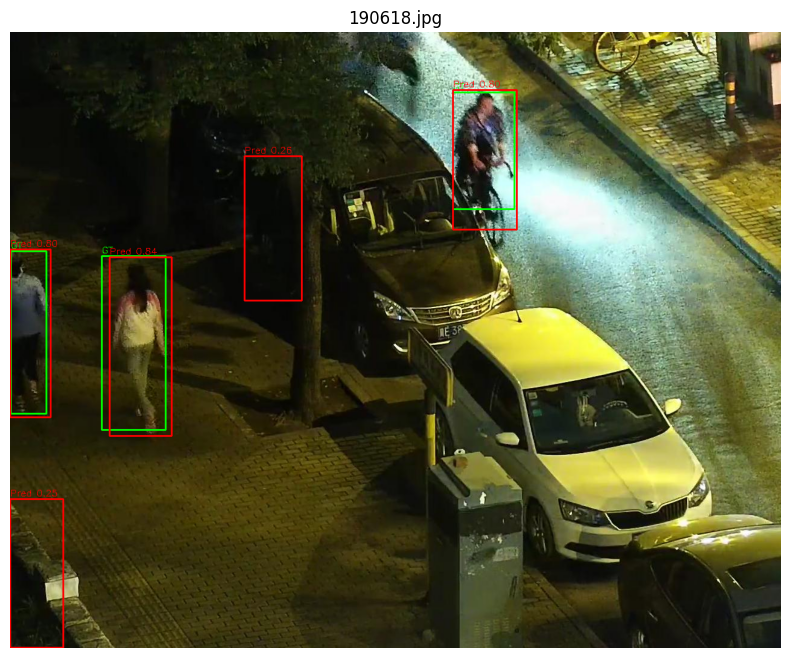

In [ ]:

for img_name in sampled:
    img_path = os.path.join(img_dir, img_name)
    gt_path = os.path.join(gt_dir, os.path.splitext(img_name)[0] + '.txt')
    det_path = os.path.join(det_dir, os.path.splitext(img_name)[0] + '.txt')

    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Missing image: {img_name}")
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if os.path.exists(gt_path):
        with open(gt_path, 'r') as f:
            for line in f:
                box = parse_gt_line(line)
                if box:
                    x, y, bw, bh = map(int, box)
                    cv2.rectangle(img_rgb, (x, y), (x + bw, y + bh), (0, 255, 0), 2)
                    cv2.putText(img_rgb, "GT", (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    if os.path.exists(det_path):
        with open(det_path, 'r') as f:
            for line in f:
                box = parse_det_line(line)
                if box:
                    x, y, bw, bh, conf = box
                    x, y, bw, bh = int(x), int(y), int(bw), int(bh)
                    cv2.rectangle(img_rgb, (x, y), (x + bw, y + bh), (255, 0, 0), 2)
                    cv2.putText(img_rgb, f"Pred {conf:.2f}", (x, y - 5),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.title(img_name)
    plt.axis("off")
    plt.show()


Results of ensemble WBF+NMS
```
ID,value
AP@0.5,0.8772
AP@0.75,0.5634
```

Final score: **0.27970**